In [25]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
sc.set_figure_params(frameon=False, dpi=100)
import matplotlib.pyplot as plt

In [ ]:
adata = ad.read_zarr('../Finalized/adata_final.zarr')

In [8]:
# Check the number of donors per dataset
adata.obs.groupby('Dataset')['ID'].nunique() #['Lin'].tolist()

/tmp/ipykernel_19301/254619988.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('Dataset')['ID'].nunique() #['Lin'].tolist()


Dataset
Caronni            10
Ding               22
Ding_snRNA-seq     11
Lee                 5
Lin                16
Peng               24
Peng_Normal        11
Regev              43
Schlesinger         1
Simeone            27
Steele             16
Steele_Adj_Norm     3
Zhang               3
Name: ID, dtype: int64

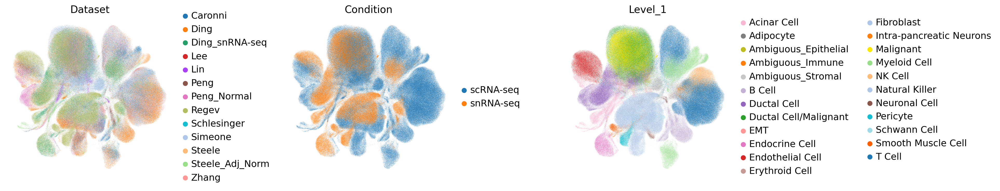

In [12]:
color_params = ['Dataset', 'Condition', 'Level_1']
sc.pl.umap(adata, color=color_params, wspace=0.5)

In [19]:
grouped = adata.obs.groupby('Dataset').size().reset_index(name='Number of Cells')
unique_ids = adata.obs.groupby('Dataset')['ID_batch_covariate'].nunique().reset_index(name='Number of Donors')
result = pd.merge(grouped, unique_ids, on='Dataset')

/tmp/ipykernel_19301/3329598125.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = adata.obs.groupby('Dataset').size().reset_index(name='Number of Cells')
/tmp/ipykernel_19301/3329598125.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  unique_ids = adata.obs.groupby('Dataset')['ID_batch_covariate'].nunique().reset_index(name='Number of Donors')


In [21]:
df_size = pd.DataFrame({
    'Caronni': {'Cells_Obtained': 75280, 'Cells_Quoted': 59569.0},
    'Ding': {'Cells_Obtained': 211138, 'Cells_Quoted': 261497.0},
    'Lee': {'Cells_Obtained': 8897, 'Cells_Quoted': 31720.0},
    'Lin': {'Cells_Obtained': 17086, 'Cells_Quoted': 14926.0},
    'Peng': {'Cells_Obtained': 57508, 'Cells_Quoted': 57530.0},
    'Regev': {'Cells_Obtained': 192044, 'Cells_Quoted': 224988.0},
    'Schlesinger': {'Cells_Obtained': 6499, 'Cells_Quoted': 5184.0},
    'Simeone': {'Cells_Obtained': 213711, 'Cells_Quoted': 139446.0},
    'Steele': {'Cells_Obtained': 48121, 'Cells_Quoted': 68438.0},
    'Zhang': {'Cells_Obtained': 37934, 'Cells_Quoted': 57702.0}, }).T

In [22]:
df_size.reset_index(inplace=True)

In [23]:
df_size.rename(columns={'index':'Dataset'}, inplace=True)

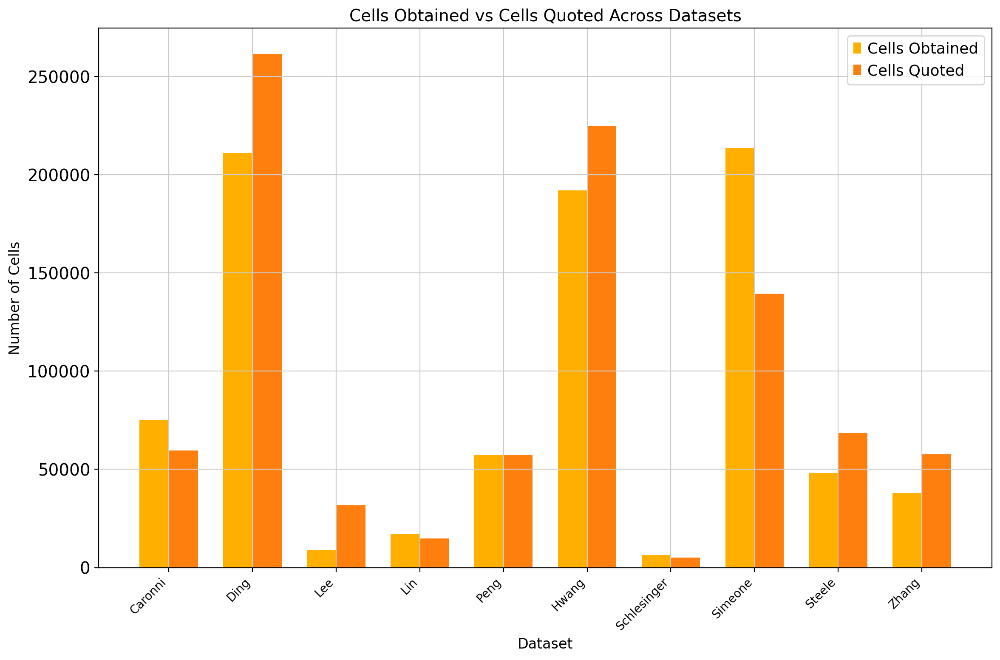

In [30]:
df_size.loc[df_size['Dataset'] == 'Regev', 'Dataset'] = 'Hwang'
datasets = df_size["Dataset"]
cells_obtained = df_size["Cells_Obtained"]
cells_quoted = df_size["Cells_Quoted"]
bar_width = 0.35
index = np.arange(len(datasets))
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
plt.figure(figsize=(12, 8))
plt.bar(index, cells_obtained, bar_width, label="Cells Obtained", color='#ffaf00')
plt.bar(index + bar_width, cells_quoted, bar_width, label="Cells Quoted", color=colors[1])
plt.xlabel("Dataset", fontsize=12)
plt.ylabel("Number of Cells", fontsize=12)
plt.title("Cells Obtained vs Cells Quoted Across Datasets", fontsize=14)
plt.xticks(index + bar_width / 2, datasets, rotation=45, ha="right", fontsize=10)
plt.legend()
plt.tight_layout()
plt.show()

In [31]:
df_outlier =  pd.DataFrame(adata.obs.groupby(['outlier', 'Level_1']).size().unstack().T)
df_outlier.columns = ['Not Outlier', 'Outlier']

/tmp/ipykernel_19301/1517646888.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_outlier =  pd.DataFrame(adata.obs.groupby(['outlier', 'Level_1']).size().unstack().T)


In [50]:
df_outlier['% Not Outlier'] = (df_outlier['Not Outlier']/df_outlier.sum(axis=1))*100
df_outlier['% Outlier'] = (df_outlier['Outlier']/df_outlier.sum(axis=1))*100

In [164]:
df_size = pd.DataFrame({
    'Caronni': {'Cells_Obtained': 75280, 'Cells_Quoted': 59569.0},
    'Ding': {'Cells_Obtained': 211138, 'Cells_Quoted': 261497.0},
    'Lee': {'Cells_Obtained': 8897, 'Cells_Quoted': 31720.0},
    'Lin': {'Cells_Obtained': 17086, 'Cells_Quoted': 14926.0},
    'Peng': {'Cells_Obtained': 57508, 'Cells_Quoted': 57530.0},
    'Regev': {'Cells_Obtained': 192044, 'Cells_Quoted': 224988.0},
    'Schlesinger': {'Cells_Obtained': 6499, 'Cells_Quoted': 5184.0},
    'Simeone': {'Cells_Obtained': 213711, 'Cells_Quoted': 139446.0},
    'Steele': {'Cells_Obtained': 48121, 'Cells_Quoted': 68438.0},
    'Zhang': {'Cells_Obtained': 37934, 'Cells_Quoted': 57702.0}, }).T

In [168]:
df_size.reset_index(inplace=True)

In [170]:
df_size.rename(columns={'index':'Dataset'}, inplace=True)

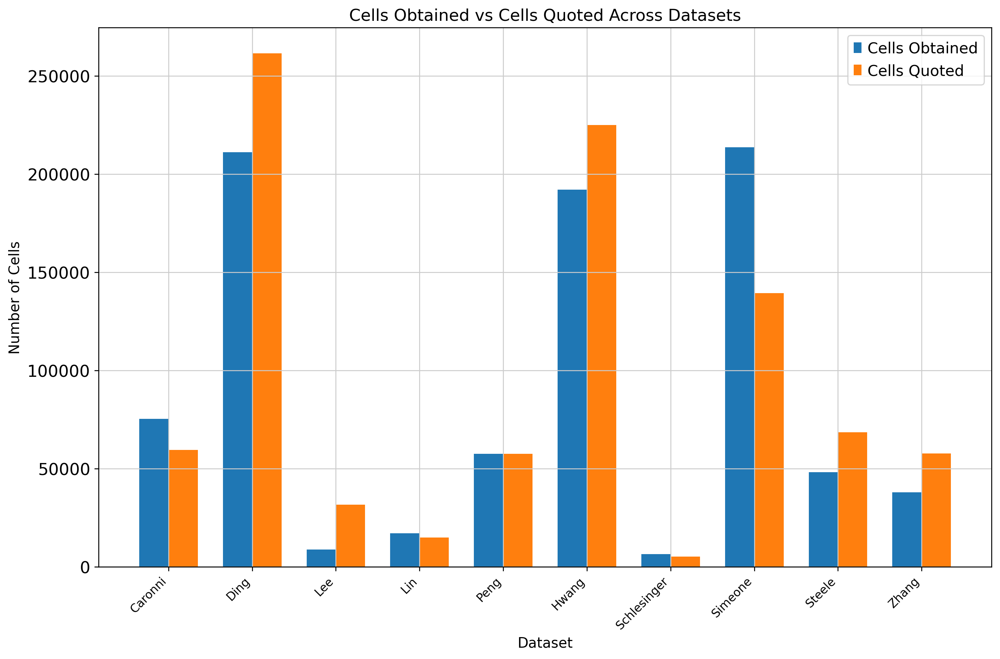

In [172]:
df_size.loc[df_size['Dataset'] == 'Regev', 'Dataset'] = 'Hwang'

# Data for plotting
datasets = df_size["Dataset"]
cells_obtained = df_size["Cells_Obtained"]
cells_quoted = df_size["Cells_Quoted"]

# Bar width
bar_width = 0.35

# Positions for bars
index = np.arange(len(datasets))

# Extract the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Plotting grouped bar chart with explicit colors
plt.figure(figsize=(12, 8))
plt.bar(index, cells_obtained, bar_width, label="Cells Obtained", color=colors[0])
plt.bar(index + bar_width, cells_quoted, bar_width, label="Cells Quoted", color=colors[1])

# Adding labels and title
plt.xlabel("Dataset", fontsize=12)
plt.ylabel("Number of Cells", fontsize=12)
plt.title("Cells Obtained vs Cells Quoted Across Datasets", fontsize=14)
plt.xticks(index + bar_width / 2, datasets, rotation=45, ha="right", fontsize=10)
plt.legend()
plt.tight_layout()

# Show plot
plt.show()

In [54]:
df_outlier = adata.obs.groupby(['Level_1', 'outlier']).size().unstack()
df_outlier.columns = ['Not Outlier', 'Outlier']
df_outlier['% Not Outlier'] = (df_outlier['Not Outlier']/df_outlier.sum(axis=1))*100
df_outlier['% Outlier'] = (df_outlier['Outlier']/df_outlier.sum(axis=1))*100

/tmp/ipykernel_19301/1496992045.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_outlier = adata.obs.groupby(['Level_1', 'outlier']).size().unstack()


In [164]:
df_size = pd.DataFrame({
    'Caronni': {'Cells_Obtained': 75280, 'Cells_Quoted': 59569.0},
    'Ding': {'Cells_Obtained': 211138, 'Cells_Quoted': 261497.0},
    'Lee': {'Cells_Obtained': 8897, 'Cells_Quoted': 31720.0},
    'Lin': {'Cells_Obtained': 17086, 'Cells_Quoted': 14926.0},
    'Peng': {'Cells_Obtained': 57508, 'Cells_Quoted': 57530.0},
    'Regev': {'Cells_Obtained': 192044, 'Cells_Quoted': 224988.0},
    'Schlesinger': {'Cells_Obtained': 6499, 'Cells_Quoted': 5184.0},
    'Simeone': {'Cells_Obtained': 213711, 'Cells_Quoted': 139446.0},
    'Steele': {'Cells_Obtained': 48121, 'Cells_Quoted': 68438.0},
    'Zhang': {'Cells_Obtained': 37934, 'Cells_Quoted': 57702.0}, }).T

In [168]:
df_size.reset_index(inplace=True)

In [170]:
df_size.rename(columns={'index':'Dataset'}, inplace=True)

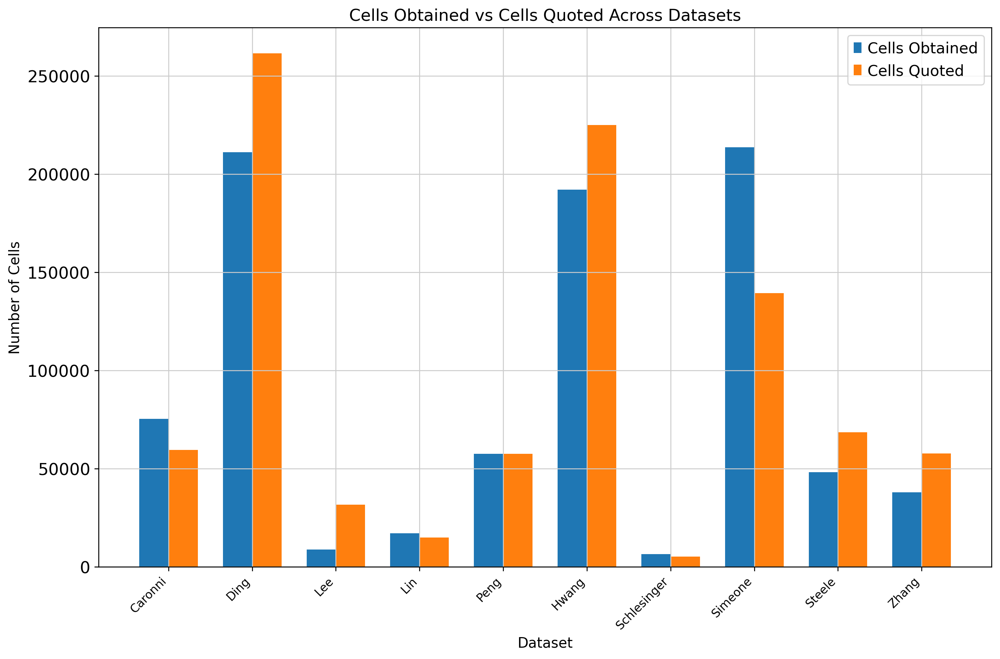

In [172]:
df_size.loc[df_size['Dataset'] == 'Regev', 'Dataset'] = 'Hwang'

# Data for plotting
datasets = df_size["Dataset"]
cells_obtained = df_size["Cells_Obtained"]
cells_quoted = df_size["Cells_Quoted"]

# Bar width
bar_width = 0.35

# Positions for bars
index = np.arange(len(datasets))

# Extract the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Plotting grouped bar chart with explicit colors
plt.figure(figsize=(12, 8))
plt.bar(index, cells_obtained, bar_width, label="Cells Obtained", color=colors[0])
plt.bar(index + bar_width, cells_quoted, bar_width, label="Cells Quoted", color=colors[1])

# Adding labels and title
plt.xlabel("Dataset", fontsize=12)
plt.ylabel("Number of Cells", fontsize=12)
plt.title("Cells Obtained vs Cells Quoted Across Datasets", fontsize=14)
plt.xticks(index + bar_width / 2, datasets, rotation=45, ha="right", fontsize=10)
plt.legend()
plt.tight_layout()

# Show plot
plt.show()

In [64]:
df_outlier = adata.obs.groupby(['Level_1', 'outlier']).size().unstack()
df_outlier.columns = ['Not Outlier', 'Outlier']

/tmp/ipykernel_19301/2599078457.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_outlier = adata.obs.groupby(['Level_1', 'outlier']).size().unstack()


In [74]:
df_outlier['% Not Outlier'] = (df_outlier['Not Outlier']/df_outlier[['Not Outlier', 'Outlier']].sum(axis=1))*100
df_outlier['% Outlier'] = (df_outlier['Outlier']/df_outlier[['Not Outlier', 'Outlier']].sum(axis=1))*100

In [ ]:
adata.obs.outlier = adata.obs.outlier.astype(str)
adata.obs.outlier = adata.obs.outlier.map({'0': 'Not Outlier', '1': 'Outlier'})

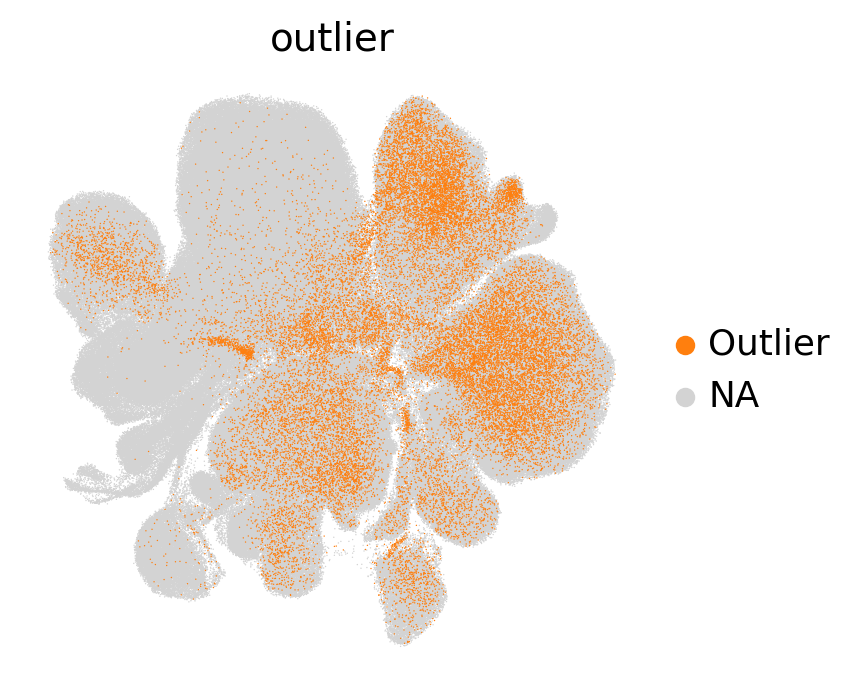

In [127]:
sc.pl.umap(adata, color='outlier', groups='Outlier', size=1, )

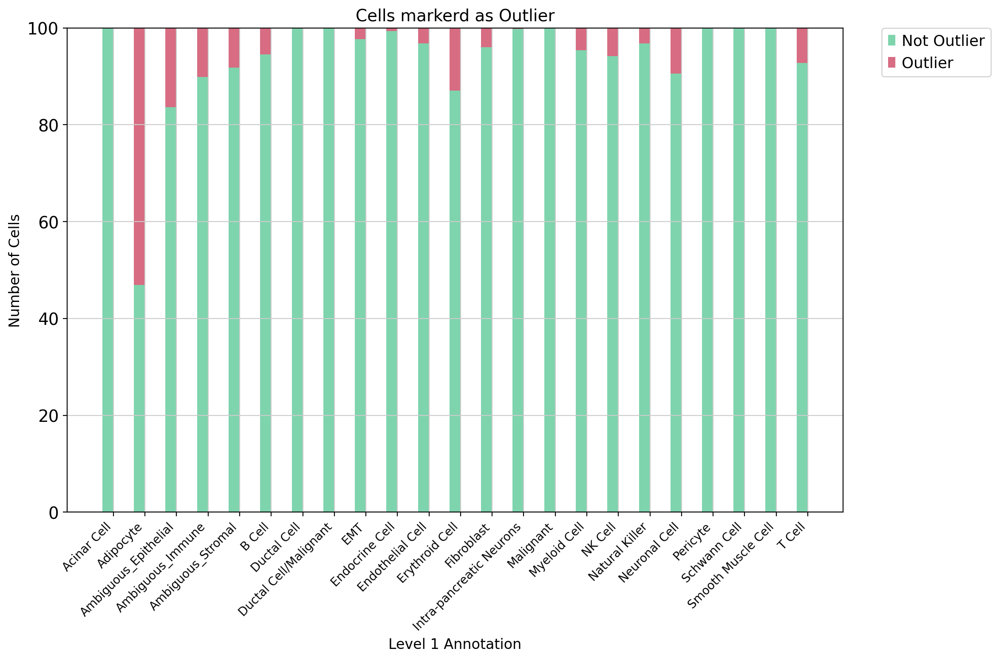

In [76]:
cells = df_outlier.index
not_outlier = df_outlier['% Not Outlier']
outlier = df_outlier['% Outlier']
bar_width = 0.35
index = np.arange(len(cells))
plt.figure(figsize=(12, 8))
plt.bar(index, not_outlier, bar_width, label="Not Outlier", color='#7ED4AD')
plt.bar(index, outlier, bar_width, label="Outlier", color='#D76C82', bottom=not_outlier)
plt.xlabel("Level 1 Annotation", fontsize=12)
plt.ylabel("Number of Cells", fontsize=12)
plt.title("Cells markerd as Outlier", fontsize=14)
plt.xticks(index + bar_width / 2, cells, rotation=45, ha="right", fontsize=10)
plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.tight_layout()
plt.show()

In [86]:
df_id = adata.obs.groupby(['ID_batch_covariate', 'Level_1']).size().unstack()
df_normalized_id = (df_id.div(df_id.sum(axis=1), axis=0)) * 100
# df_id['% Outlier'] = (df_id['Outlier']/df_id[['Not Outlier', 'Outlier']].sum(axis=1))*100

/tmp/ipykernel_19301/2768643810.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_id = adata.obs.groupby(['ID_batch_covariate', 'Level_1']).size().unstack()


/tmp/ipykernel_19301/1978612874.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


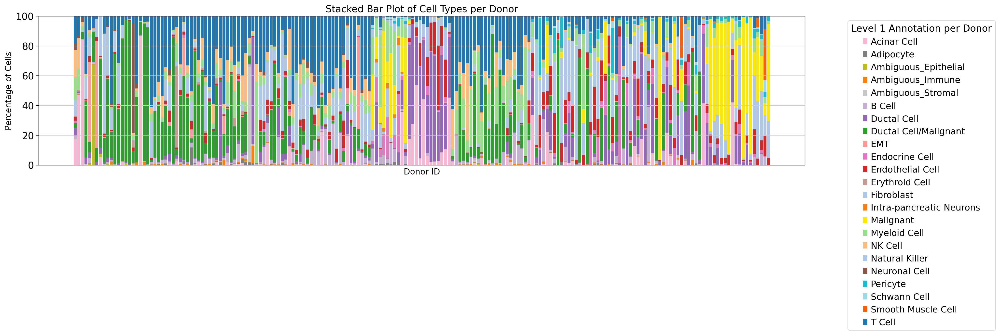

In [109]:
level_1_categories = adata.obs['Level_1'].cat.categories if hasattr(adata.obs['Level_1'], 'cat') else adata.obs['Level_1'].unique()
colors_list = adata.uns['Level_1_colors']
color_mapping = dict(zip(level_1_categories, colors_list))
categories = df_normalized_id.columns
x_positions = np.arange(len(df_normalized_id.index))
colors = [color_mapping[category] for category in categories]  # Extract colors for categories

# Create a stacked bar plot
plt.figure(figsize=(20, 4))

# Stack each category
bottom_values = np.zeros(len(df_normalized_id.index))  # Keeps track of the bottom of each stack
for category, color in zip(categories, colors):
    plt.bar(x_positions, df_normalized_id[category], label=category, color=color, bottom=bottom_values)
    bottom_values += df_normalized_id[category]

# Customize the plot
plt.xlabel("Donor ID", fontsize=12)
plt.ylabel("Percentage of Cells", fontsize=12)
plt.title("Stacked Bar Plot of Cell Types per Donor", fontsize=14)
# plt.xticks(x_positions, df_normalized_id.index, rotation=45, ha="right", fontsize=8)
plt.xticks([], [])
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", title="Level 1 Annotation per Donor")
plt.tight_layout()

# Show the plot
plt.show()

In [111]:
adata_no_outlier = adata[adata.obs.outlier == 0].copy()

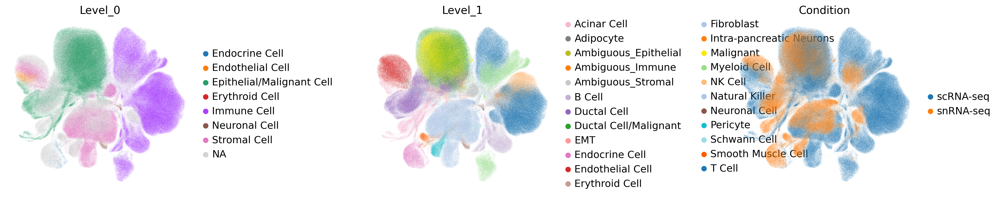

In [269]:
sc.pl.umap(adata_no_outlier, color=['Level_0', 'Level_1', 'Condition'], wspace=0.75)

# Try to resolve the ambiguous

In [130]:
adata_ambi = adata_no_outlier[adata_no_outlier.obs.Level_1.str.contains('Ambi')]

In [133]:
adata_ambi.obs.columns[adata_ambi.obs.columns.str.contains('leiden')]

Index(['leiden', 'leiden_0.2', 'leiden_0.2_annotation', 'leiden_subcluster',
       'level0_leiden_subcluster', 'leiden_0.5'],
      dtype='object')

In [ ]:
# 'leiden' is leiden clustering on the whole scRNA-seq object
# 'leiden_subcluster' is leiden subclustering at 0.1 on the clusters from 'leiden'
# these two were used for final Level 0 anntoation
# 'level0_leiden_subcluster' is the leiden subclustering done on the Level 0 annotated cell clusters
# these subclusters were used for Level 1 annotations
# TODO necessary? change to text cell?

In [144]:
adata_ambi.obs.outlier = adata_ambi.obs.outlier.astype(str)

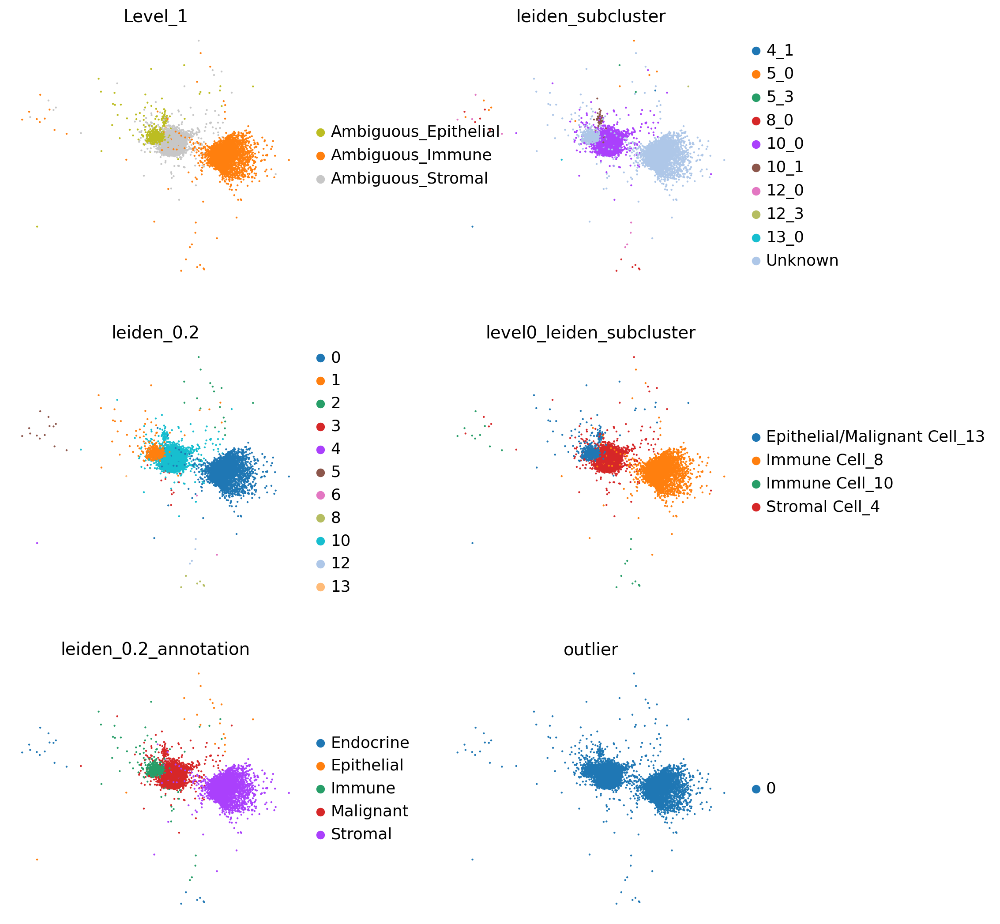

In [150]:
sc.pl.umap(adata_ambi, color=['Level_1', 'leiden_subcluster', 'leiden_0.2', 'level0_leiden_subcluster', 'leiden_0.2_annotation', 'outlier'], ncols=2, wspace=0.35)

In [148]:
for cluster in adata_ambi.obs.level0_leiden_subcluster.unique().tolist():
    adata_temp = adata_ambi[adata_ambi.obs.level0_leiden_subcluster == cluster]
    print(cluster, adata_temp.shape)

Immune Cell_8 (3351, 2505)
Stromal Cell_4 (8183, 2505)
Epithelial/Malignant Cell_13 (617, 2505)
Immune Cell_10 (19, 2505)


In [345]:
def analyse_subclusters(adata, cell_type, resolution=0.1):
    # Subset the data for Level_1 (specific cell type)
    subcluster_level_1 = adata[adata.obs['level0_leiden_subcluster'].isin(cell_type)].copy()
    print(subcluster_level_1.shape)
    # Perform Leiden clustering on Level_1 subset
    sc.pp.neighbors(subcluster_level_1, use_rep='X_scpoli')
    sc.tl.leiden(subcluster_level_1, resolution=resolution)
    # Visualize the subclusters in UMAP space
    subcluster_level_1.obs['level0_leiden_sub_subcluster'] = [f"{subcluster}_{leiden}" 
          for subcluster, leiden in zip(subcluster_level_1.obs['level0_leiden_subcluster'], subcluster_level_1.obs['leiden'])]
    sc.pl.umap(subcluster_level_1, color=['leiden', 'level0_leiden_subcluster', 'level0_leiden_sub_subcluster'], frameon=False, layer='log_norm')
    return subcluster_level_1

In [311]:
def rank_genes_groups_level_0(adata, adata_leiden, cell_type):
    subset = adata[adata.obs.Level_0 == cell_type].copy()
    print(subset.shape)
    subset.obs['level0_leiden_sub_subcluster'] = subset.obs['level0_leiden_subcluster'].copy()
    subset.obs['level0_leiden_sub_subcluster'] = subset.obs['level0_leiden_sub_subcluster'].astype(str)
    subset.obs.loc[adata_leiden.obs_names, 'level0_leiden_sub_subcluster'] = adata_leiden.obs['level0_leiden_sub_subcluster']
    subset.obs['level0_leiden_sub_subcluster'] = subset.obs['level0_leiden_sub_subcluster'].astype(str)
    # print(subset.obs['level0_leiden_sub_subcluster'].unique().tolist())
    subset_subset = subset[subset.obs.level0_leiden_sub_subcluster.str.contains(cell_type)]
    sc.tl.rank_genes_groups(subset_subset, groupby='level0_leiden_sub_subcluster', layer='log_norm')
    sc.pl.rank_genes_groups(subset_subset)
    df = pd.DataFrame(subset_subset.uns['rank_genes_groups']['names'])
    if 'level0_leiden_sub_subcluster' not in adata_no_outlier.obs:
        adata_no_outlier.obs['level0_leiden_sub_subcluster'] = adata_no_outlier.obs['level0_leiden_subcluster'].copy()
    adata_no_outlier.obs['level0_leiden_sub_subcluster']= adata_no_outlier.obs['level0_leiden_sub_subcluster'].astype(str)
    adata_no_outlier.obs.loc[adata_leiden.obs_names, 'level0_leiden_sub_subcluster'] = adata_leiden.obs['level0_leiden_sub_subcluster']
    return df, subset

# Immune cells

(3370, 2505)


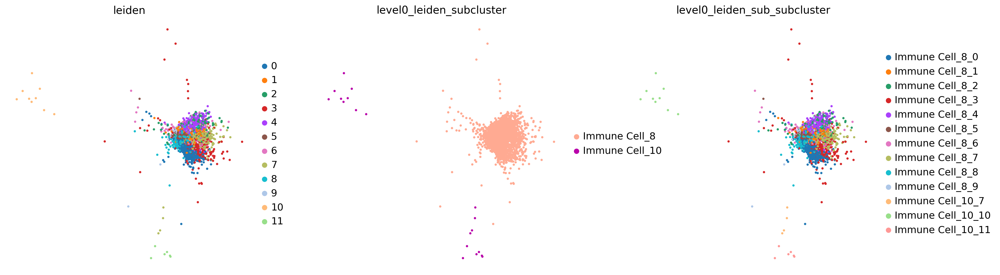

In [365]:
immune_cells = analyse_subclusters(adata_no_outlier, ['Immune Cell_8', 'Immune Cell_10'], resolution=0.75)

In [366]:
immune_cells.obs.level0_leiden_sub_subcluster = immune_cells.obs.level0_leiden_sub_subcluster.replace(['Immune Cell_10_7', 'Immune Cell_10_10', 'Immune Cell_10_11'], ['Immune Cell_10_0', 'Immune Cell_10_1', 'Immune Cell_10_2'])

/tmp/ipykernel_19301/1624577015.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  immune_cells.obs.level0_leiden_sub_subcluster = immune_cells.obs.level0_leiden_sub_subcluster.replace(['Immune Cell_10_7', 'Immune Cell_10_10', 'Immune Cell_10_11'], ['Immune Cell_10_0', 'Immune Cell_10_1', 'Immune Cell_10_2'])


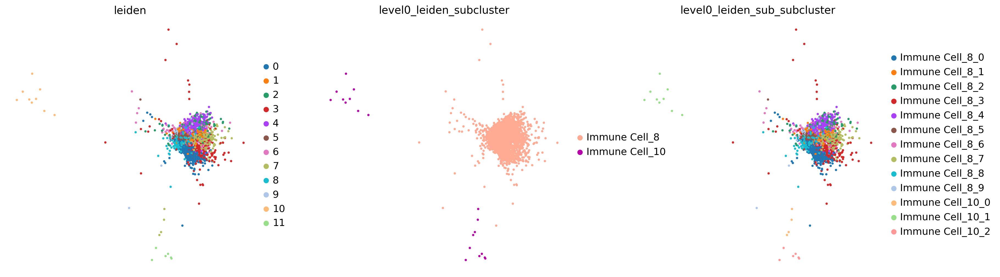

In [367]:
sc.pl.umap(immune_cells, color=['leiden', 'level0_leiden_subcluster', 'level0_leiden_sub_subcluster'], frameon=False, layer='log_norm')

(266728, 2505)


/home/aih/shrey.parikh/miniconda3/envs/scanpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/aih/shrey.parikh/miniconda3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/aih/shrey.parikh/miniconda3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=

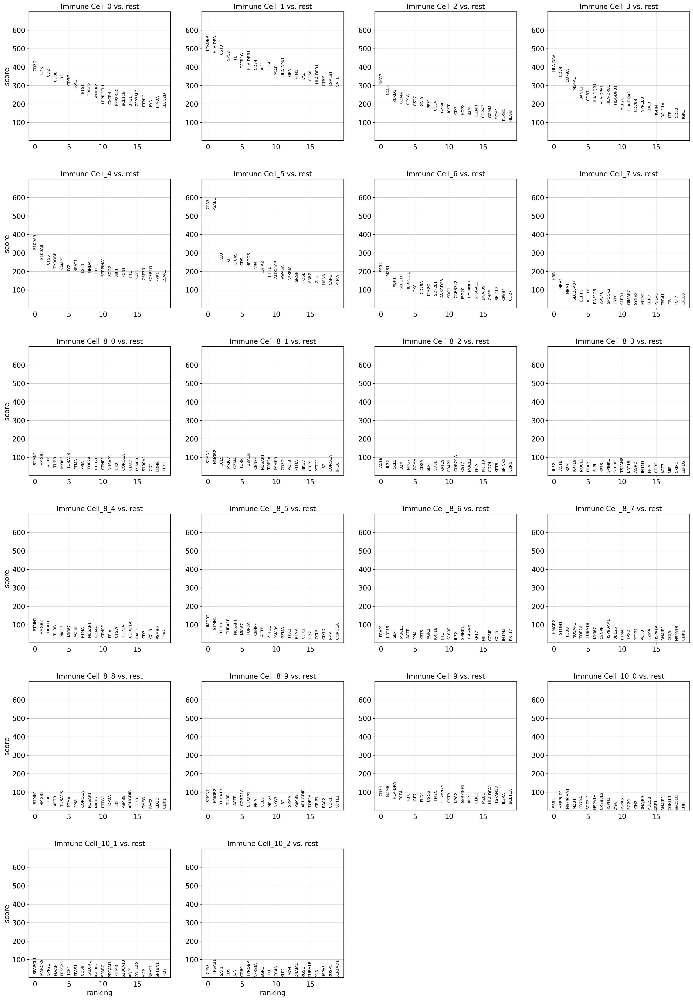

In [368]:
df_immune_cells, immune_cell_all = rank_genes_groups_level_0(adata_no_outlier, immune_cells, 'Immune Cell')

In [370]:
groups=['Immune Cell_8_0', 'Immune Cell_8_1', 'Immune Cell_8_2',
       'Immune Cell_8_3', 'Immune Cell_8_4', 'Immune Cell_8_5',
       'Immune Cell_8_6', 'Immune Cell_8_7', 'Immune Cell_8_8',
       'Immune Cell_8_9', 'Immune Cell_9', 'Immune Cell_10_0',
       'Immune Cell_10_1', 'Immune Cell_10_2']

In [377]:
groups_plot=['Level_1', 'Immune Cell_8_0', 'Immune Cell_8_1', 'Immune Cell_8_2',
       'Immune Cell_8_3', 'Immune Cell_8_4', 'Immune Cell_8_5',
       'Immune Cell_8_6', 'Immune Cell_8_7', 'Immune Cell_8_8',
       'Immune Cell_8_9', 'Immune Cell_9', 'Immune Cell_10_0',
       'Immune Cell_10_1', 'Immune Cell_10_2']

In [401]:
adata_no_outlier.obs.Level_1 = adata_no_outlier.obs.Level_1.replace('NK Cell', 'Natural Killer')

/tmp/ipykernel_19301/2526614374.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_no_outlier.obs.Level_1 = adata_no_outlier.obs.Level_1.replace('NK Cell', 'Natural Killer')


In [412]:
color_dict = {
    'T Cell': '#1f77b4',
    'Fibroblast': '#aec7e8',
    'Ambiguous_Immune': '#ff7f0e',
    'Natural Killer': '#ffbb78',  # Updated to a distinct shade of green
    'Ductal Cell/Malignant': '#2ca02c',
    'Myeloid Cell': '#98df8a',
    'Endothelial Cell': '#d62728',
    'EMT': '#ff9896',
    'Ductal Cell': '#9467bd',
    'B Cell': '#c5b0d5',
    'Neuronal Cell': '#8c564b',
    'Erythroid Cell': '#c49c94',
    'Endocrine Cell': '#e377c2',
    'Acinar Cell': '#f7b6d2',
    'Adipocyte': '#7f7f7f',
    'Ambiguous_Stromal': '#c7c7c7',
    'Ambiguous_Epithelial': '#bcbd22',
    'Malignant': '#fce803',
    'Pericyte': '#17becf',
    'Schwann Cell': '#9edae5',
    'Smooth Muscle Cell': '#fc5e03',
    'Intra-pancreatic Neurons': '#1ca85c'  # Updated to a distinct shade of orange
}

In [403]:
adata_no_outlier.uns['Level_1_colors'] = [color_dict[cat] for cat in adata_no_outlier.obs['Level_1'].cat.categories]

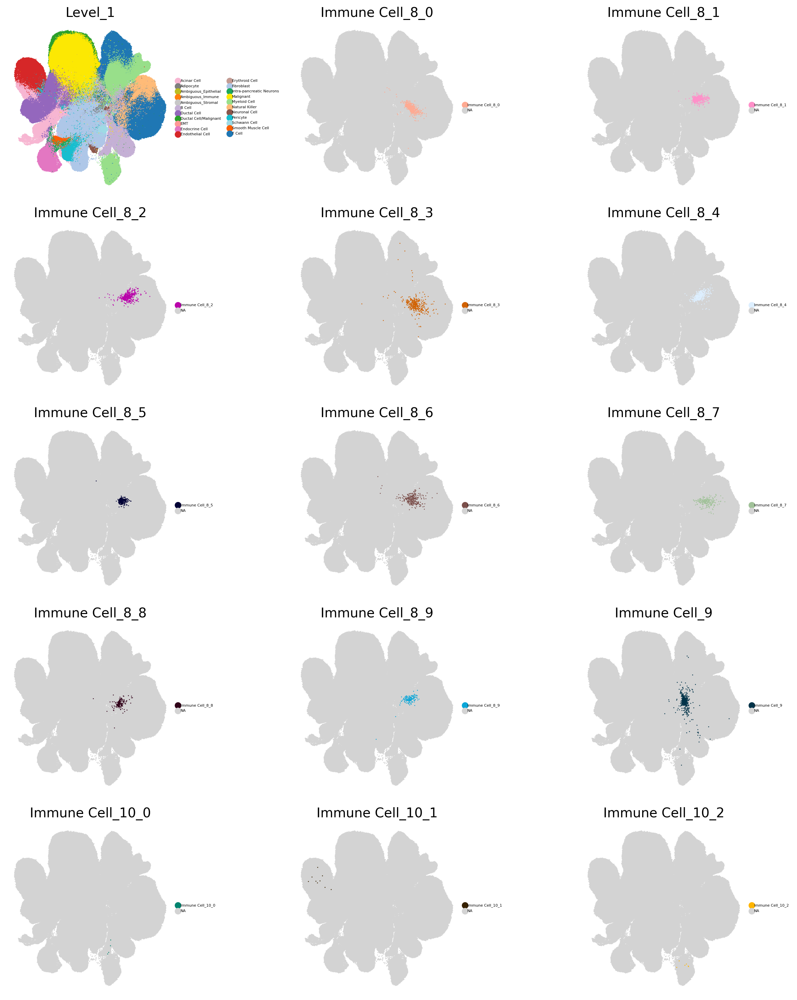

In [404]:
fig, axs = plt.subplots(5, 3, figsize=(12, 15))
axs = axs.flatten()
for idx, group in enumerate(groups_plot):
    ax=axs[idx]
    if group == 'Level_1':
        sc.pl.umap(
        adata_no_outlier,
        color=group,
        frameon=False,
        ax=ax,
        show=False,
        legend_fontsize=4,
        size=3)
    else:
        sc.pl.umap(
            adata_no_outlier,
            color='level0_leiden_sub_subcluster',
            frameon=False,
            groups=group,
            title=group,
            ax=ax,
            show=False,
            legend_fontsize=4,
            size=4)
plt.tight_layout()
plt.show()
# sc.pl.umap(adata_no_outlier, color=['level0_leiden_sub_subcluster'], groups=groups, size=5)

In [405]:
immune_cell_types = {
    "Immune Cell_8_0": "T Cell",
    "Immune Cell_8_1": "T Cell",
    "Immune Cell_8_2": "Natural Killer",
    "Immune Cell_8_3": "T Cell",
    "Immune Cell_8_4": "T Cell",
    "Immune Cell_8_5": "T Cell",
    "Immune Cell_8_6": "T Cell",
    "Immune Cell_8_7": "T Cell",
    "Immune Cell_8_8": "T Cell",
    "Immune Cell_8_9": "T Cell",
    "Immune Cell_9": "Myeloid Cell",
    "Immune Cell_10_0": "B Cell",
    "Immune Cell_10_1": "Endothelial Cell",
    "Immune Cell_10_2": "Myeloid Cell",
}

In [407]:
adata_no_outlier.obs.Level_1_refined = adata_no_outlier.obs.Level_1.copy()
adata_no_outlier.obs.Level_1_refined = adata_no_outlier.obs.Level_1_refined.replace('NK Cell', 'Natural Killer')

adata_no_outlier.obs['Level_1_refined'] = np.where(
    adata_no_outlier.obs['level0_leiden_sub_subcluster'].map(immune_cell_types).notna(),  # Check if mapping exists
    adata_no_outlier.obs['level0_leiden_sub_subcluster'].map(immune_cell_types),         # Use mapped value
    adata_no_outlier.obs['Level_1_refined']                                             # Retain existing value
)

In [413]:
adata_no_outlier.uns['Level_1_refined_colors'] = [color_dict[cat] for cat in adata_no_outlier.obs['Level_1_refined'].cat.categories]

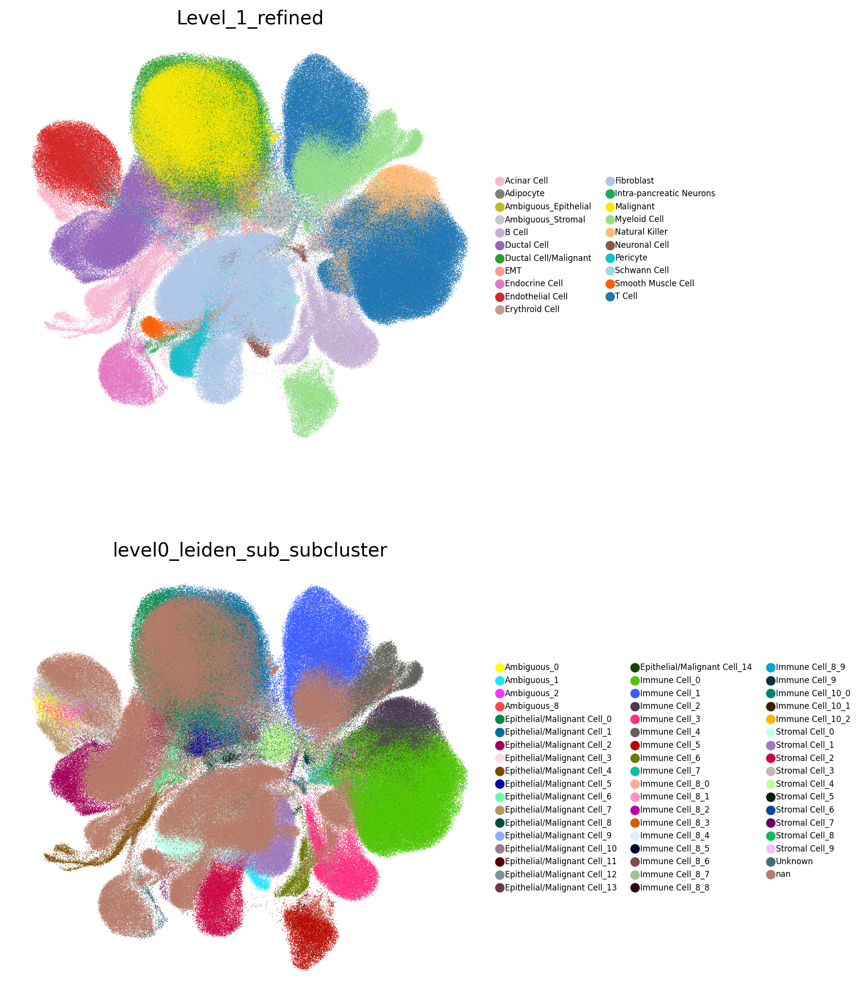

In [414]:
sc.pl.umap(adata_no_outlier, color=['Level_1_refined','level0_leiden_sub_subcluster'] , size=1, ncols=1, legend_fontsize=6)

# Epithelial Cells

(617, 2505)


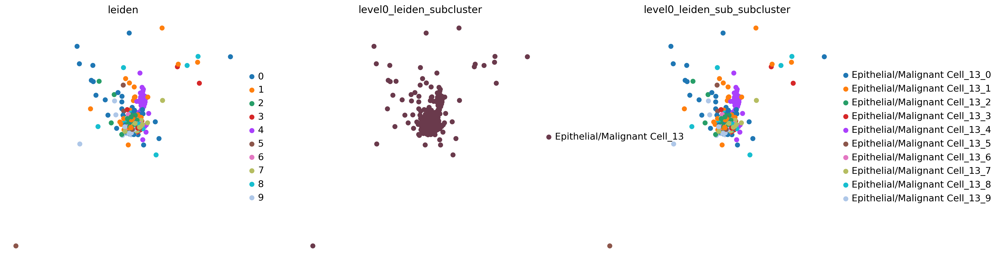

In [450]:
epi_cells = analyse_subclusters(adata_no_outlier, ['Epithelial/Malignant Cell_13'], resolution=0.85)

(209350, 2505)


/home/aih/shrey.parikh/miniconda3/envs/scanpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/aih/shrey.parikh/miniconda3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/aih/shrey.parikh/miniconda3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=

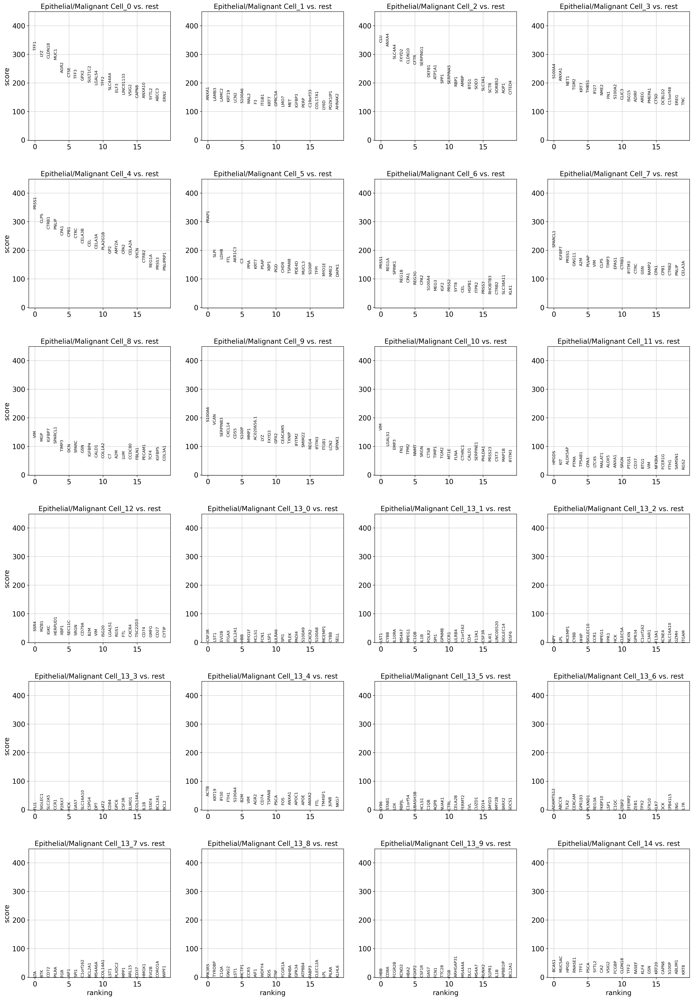

In [451]:
df_epi_cells, epi_cell_all = rank_genes_groups_level_0(adata_no_outlier, epi_cells, 'Epithelial/Malignant Cell')

In [465]:
groups = df_epi_cells.columns[df_epi_cells.columns.str.contains('Epithelial/Malignant Cell_13')].tolist()

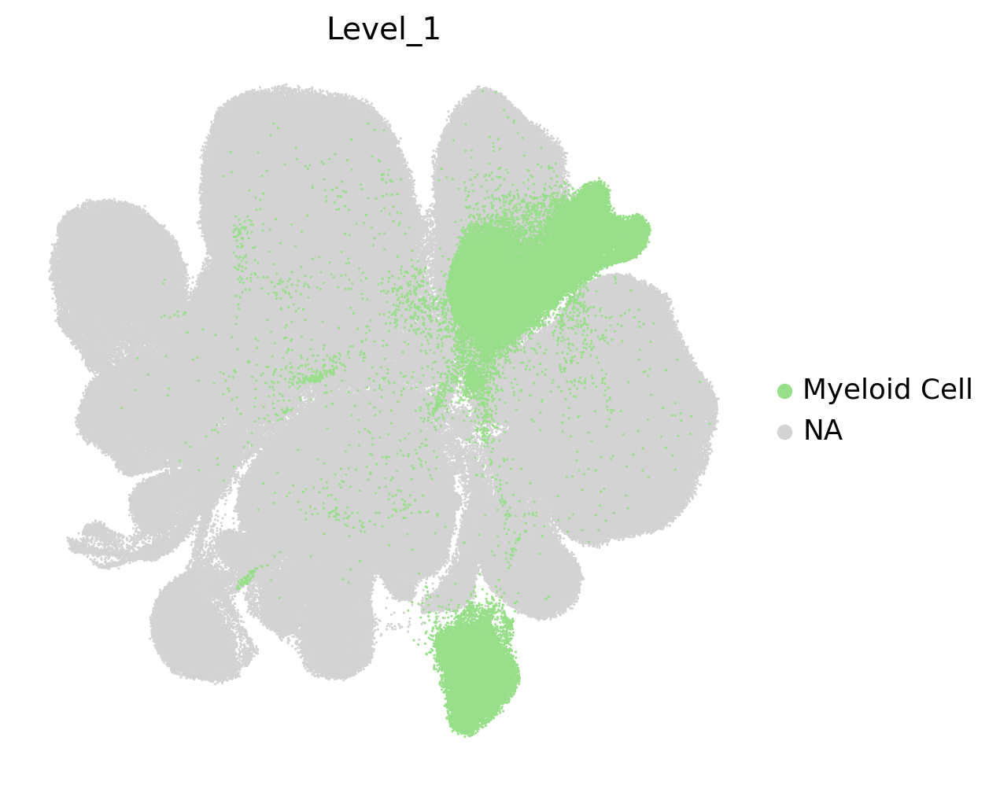

In [455]:
sc.pl.umap(adata_no_outlier, color='Level_1', groups='Myeloid Cell', size=5)

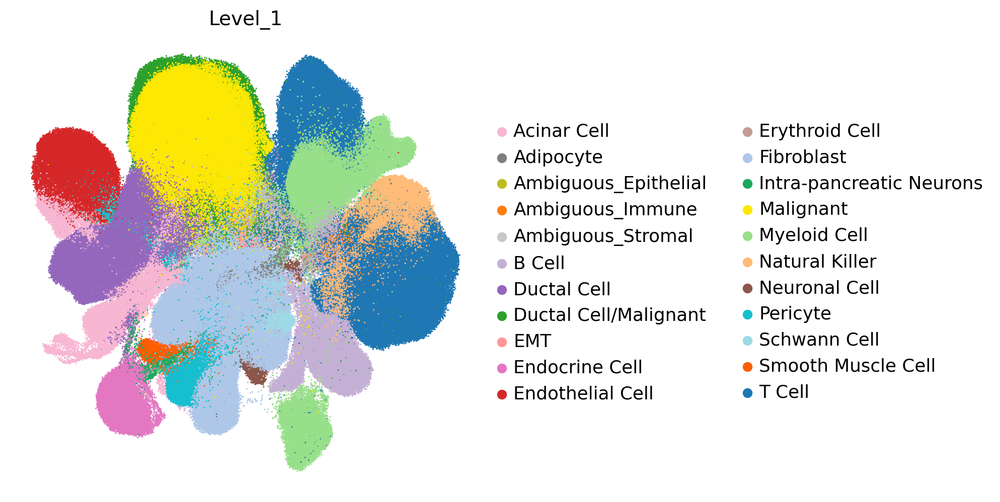

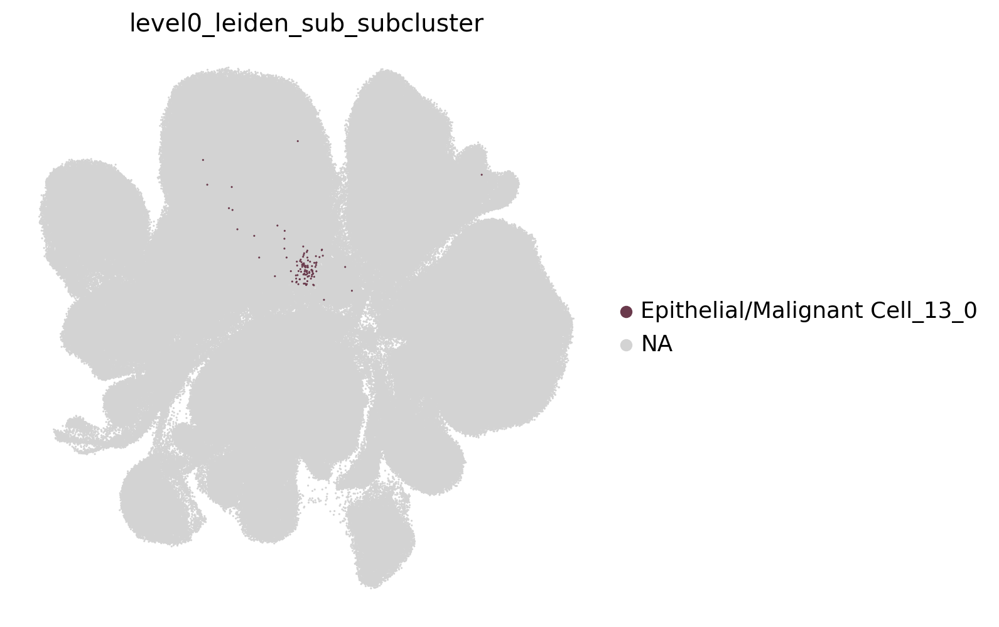

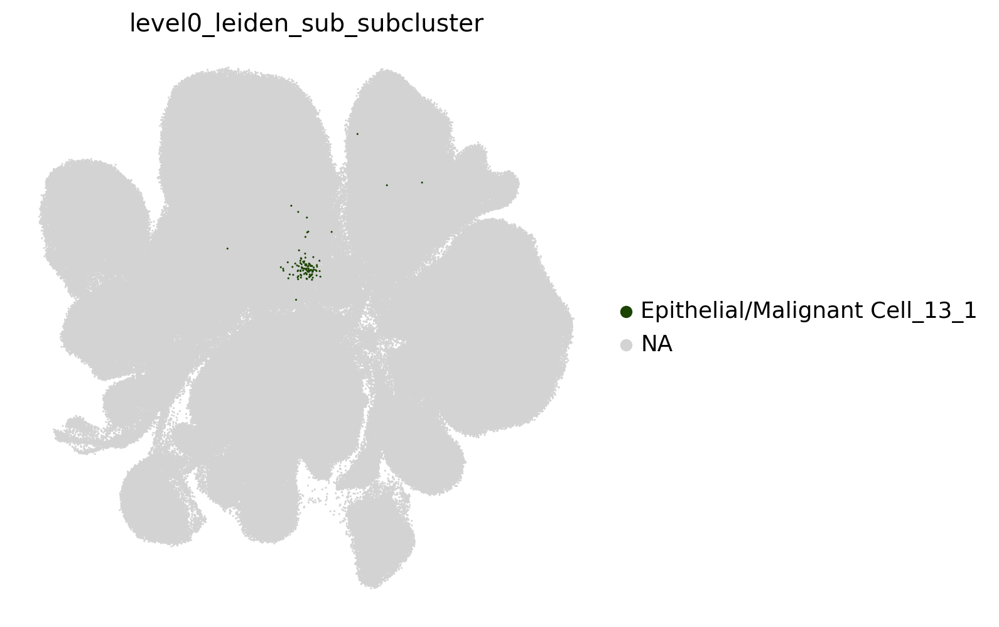

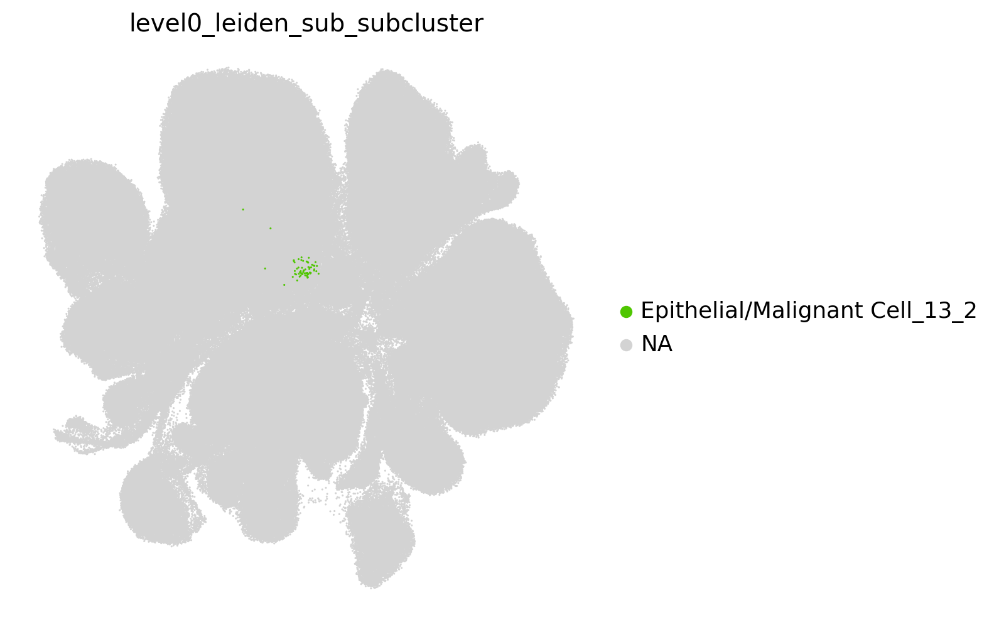

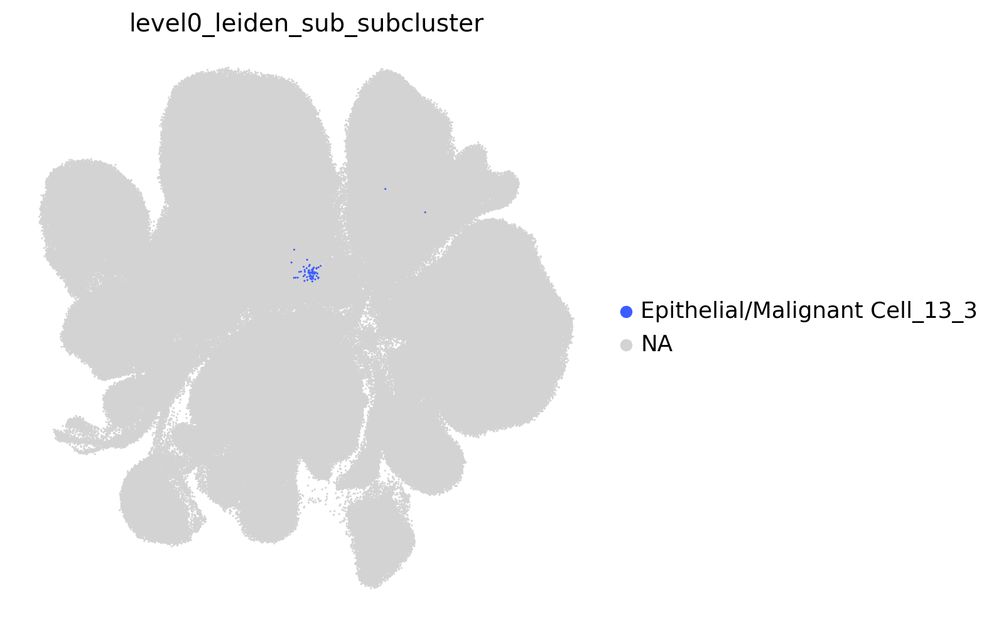

...

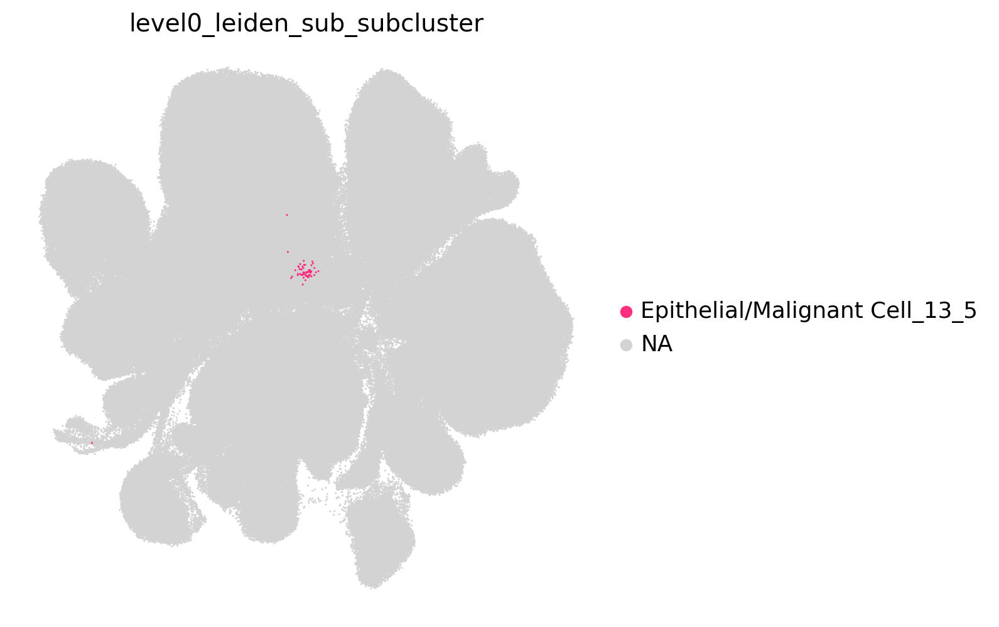

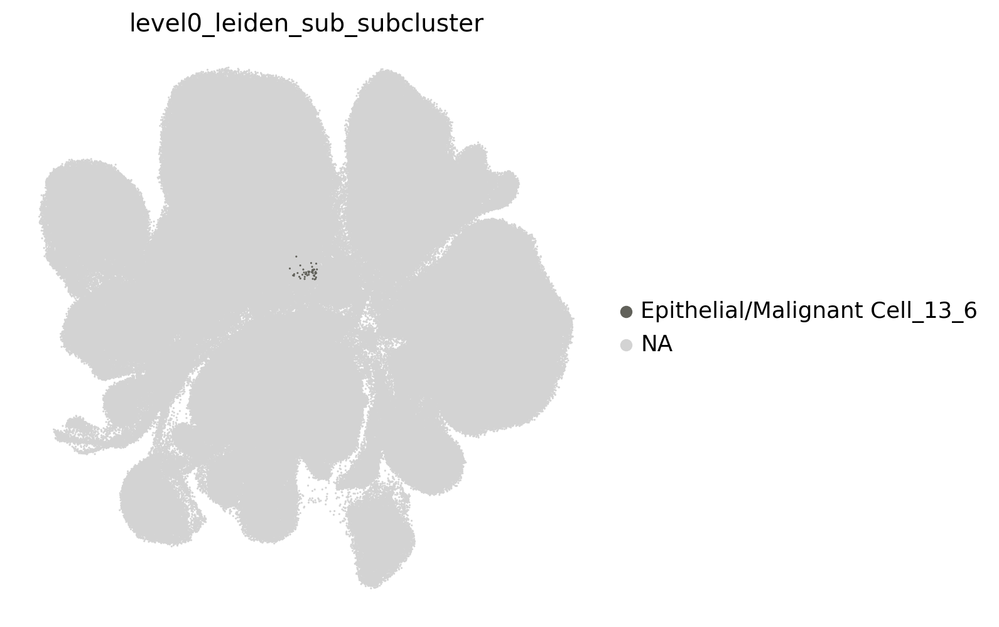

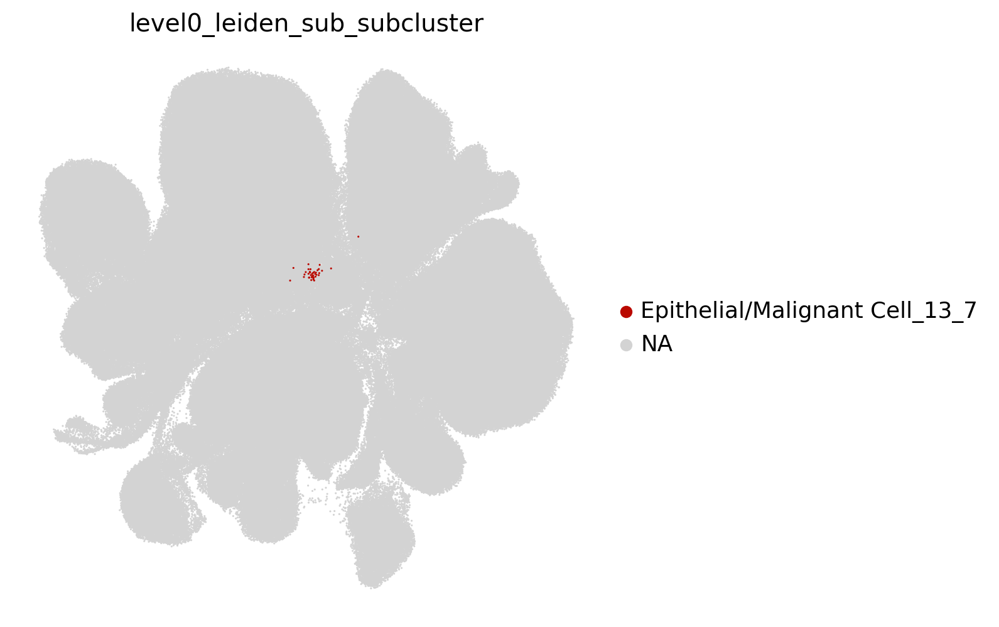

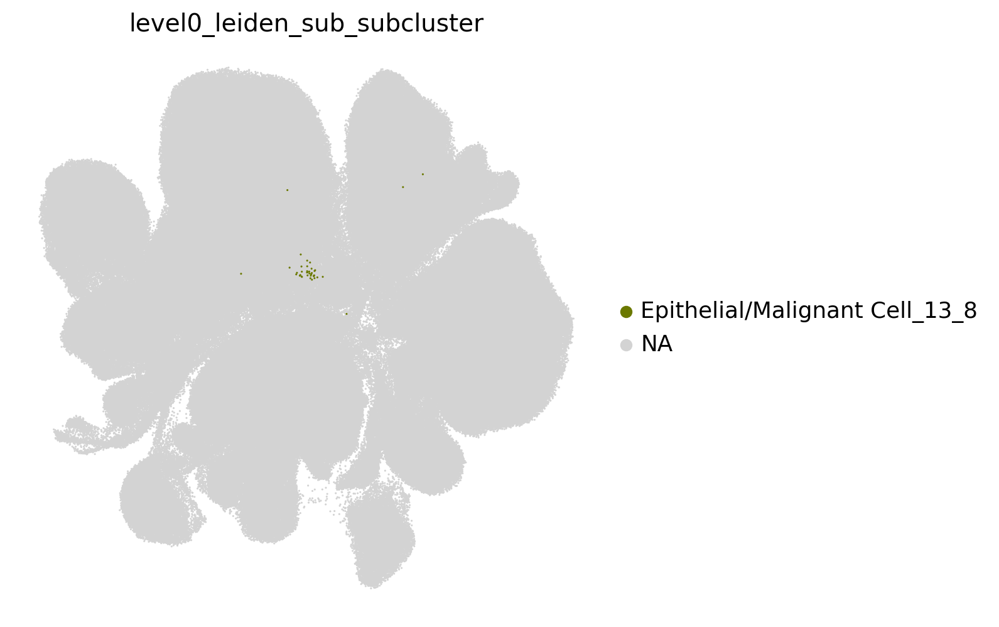

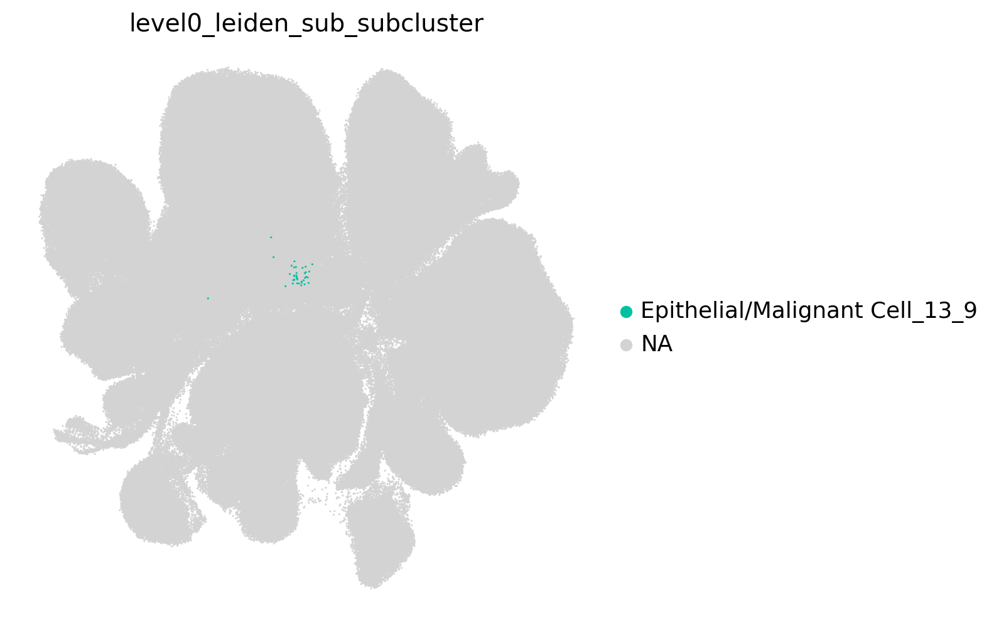

In [453]:
sc.pl.umap(adata_no_outlier, color='Level_1', size=5)
for group in groups:
    sc.pl.umap(adata_no_outlier, color='level0_leiden_sub_subcluster', groups=group, size=5)

In [ ]:
epithelial_malignant_cell_types = {
    "Epithelial/Malignant Cell_13_0": "Myeloid Cell",
    "Epithelial/Malignant Cell_13_1": "Myeloid Cell",
    "Epithelial/Malignant Cell_13_2": "Myeloid Cell",
    "Epithelial/Malignant Cell_13_3": "Myeloid Cell",
    "Epithelial/Malignant Cell_13_4": "Ductal Cell/Malignant",
    "Epithelial/Malignant Cell_13_5": "Immunosuppressive TAMs or stromal-like cells",
    "Epithelial/Malignant Cell_13_6": "Myeloid Cell",
    "Epithelial/Malignant Cell_13_7": "Myeloid Cell",
    "Epithelial/Malignant Cell_13_8": "Myeloid Cell",
    "Epithelial/Malignant Cell_13_9": "Myeloid Cell",
}

In [461]:
def rank_genes_groups_level_0(adata, adata_leiden, cell_type):
    subset = adata[adata.obs.Level_0.isin(cell_type)].copy()
    print(subset.shape)
    subset.obs['level0_leiden_sub_subcluster'] = subset.obs['level0_leiden_subcluster'].copy()
    subset.obs['level0_leiden_sub_subcluster'] = subset.obs['level0_leiden_sub_subcluster'].astype(str)
    subset.obs.loc[adata_leiden.obs_names, 'level0_leiden_sub_subcluster'] = adata_leiden.obs['level0_leiden_sub_subcluster']
    subset.obs['level0_leiden_sub_subcluster'] = subset.obs['level0_leiden_sub_subcluster'].astype(str)
    # print(subset.obs['level0_leiden_sub_subcluster'].unique().tolist())
    subset_subset = subset[subset.obs.level0_leiden_sub_subcluster.isin(cell_type)]
    sc.tl.rank_genes_groups(subset_subset, groupby='level0_leiden_sub_subcluster', layer='log_norm')
    sc.pl.rank_genes_groups(subset_subset)
    df = pd.DataFrame(subset_subset.uns['rank_genes_groups']['names'])
    if 'level0_leiden_sub_subcluster' not in adata_no_outlier.obs:
        adata_no_outlier.obs['level0_leiden_sub_subcluster'] = adata_no_outlier.obs['level0_leiden_subcluster'].copy()
    adata_no_outlier.obs['level0_leiden_sub_subcluster']= adata_no_outlier.obs['level0_leiden_sub_subcluster'].astype(str)
    adata_no_outlier.obs.loc[adata_leiden.obs_names, 'level0_leiden_sub_subcluster'] = adata_leiden.obs['level0_leiden_sub_subcluster']
    return df, subset

In [463]:
# check by doing across all cells
sc.tl.rank_genes_groups(adata_no_outlier, groupby='level0_leiden_sub_subcluster', groups=groups, layer='log_norm')

/home/aih/shrey.parikh/miniconda3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


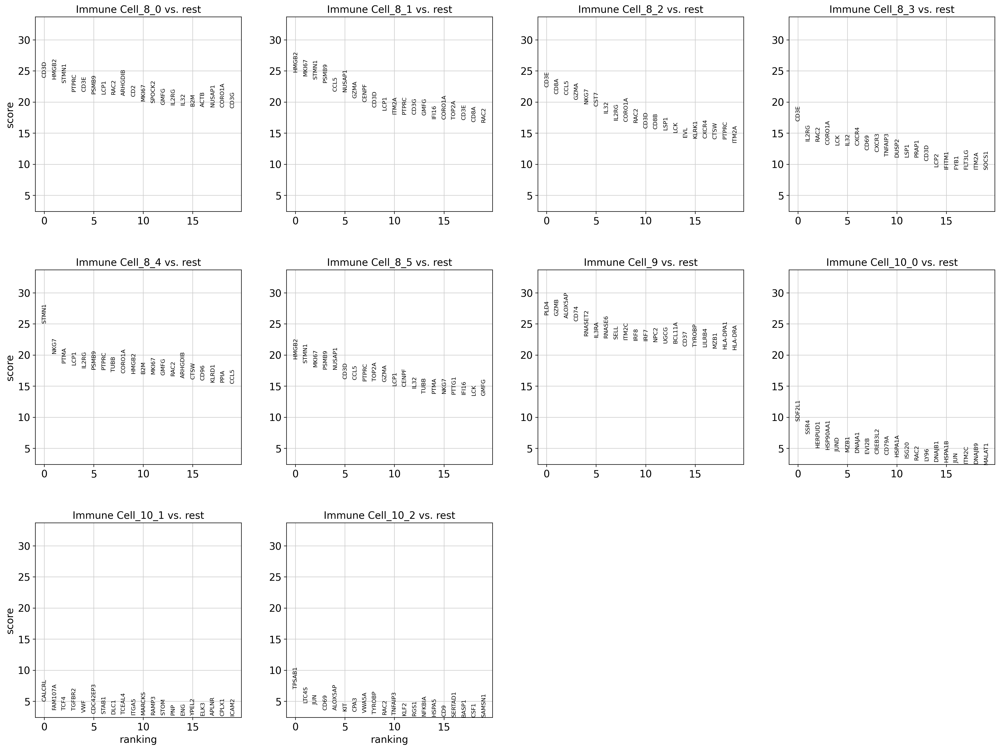

In [464]:
sc.pl.rank_genes_groups(adata_no_outlier)

In [430]:
adata_no_outlier.write_zarr('../Finalized/adata_scpoli_final_refined.zarr')